# 1. Data Collection


## MediaEval Database for Emotional Analysis in Music Dataset
Author: Soleymani, M., Aljanaki, A., Yang, Y.

Description and music styles: Royalty-free music from several sources: freemusicarchive.org (FMA), jamendo.com, and the medleyDB datase. The excerpts which were annotated are available in the same package song ids between 1 and 2058. The dataset consists of 2014 development set (744 songs), 2014 evaluation set (1000 songs) and 2015 evaluation set (58 songs). Includes rock, pop, soul, blues, electronic, classical, hip-hop, international, experimental, folk, jazz, country and pop genres.

Annotation strategy: Crowdsourced MTurk with each excerpt annotated at least by 10 workers. Both arousal and valence were annotated separately. Additional static annotations were collected for the whole 45 second exceprts after dynamic annotations.

Annotation (dimensional): Time-continuous arousal and valence annotation (1 Hz)

Link: http://cvml.unige.ch/databases/DEAM/

## PMEmo
Author: Zhang, K., Zhang, H., Li, S., Yang, C., Sun, L.

Description and music styles: The authors gathered songs popular all around the world: the Billboard Hot 100, the iTunes Top 100 Songs (USA), and the UK Top 40 Singles Chart. They obtained songs available from these charts from 2016 to 2017.

Annotation strategy: Similar to DEAM, the annotation was done with the slider to collect dynamic annotations at a sampling rate of 2 Hz. Additionally, annotators should make a static annotation for the whole music excerpt on nine-point scale after finishing dynamic labelling. A total of 457 subjects (236 females and 221 males) are recruited to participate in this work. The electrodermal activity was sampled continuously at a sampling rate of 50 Hz.

Annotation (dimensional): Time-continuous arousal and valence annotation (2 Hz)

Link: https://github.com/HuiZhangDB/PMEmo

# 2.Data Pre-processing

For the `MERdata.csv` file, song_id 1-199 are from DEAM, 200-400 are from PMEmo. Now we need to do the normalization. First, we need to convert all the mp3 files to wav format, then generate mel spectrograms from audio files. I created a module in `utils.py` called `mp3_to_wav` to convert all the `.mp3` files to `.wav` files. I use `utils.py` for all the utilization methods.

In [18]:
import importlib
import utils 
importlib.reload(utils)
from utils import*

2024-05-12 11:41:15.265881: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-05-12 11:41:15.294485: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-12 11:41:19.811062: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [1]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# read the csv file
df = pd.read_csv('/home/s5614279/Media Data Analytics and Modelling/MER/data/MERdata copy.csv')

print(df.head())
print(df.columns)

columns_to_normalize = ['valence_mean', 'valence_std', 'arousal_mean', 'arousal_std']

# Min-Max normalization
min_max_scaler = MinMaxScaler()
df[columns_to_normalize] = min_max_scaler.fit_transform(df[columns_to_normalize])

# calculate valence 和 arousal thresholds
valence_thresholds = calculate_thresholds(df, 'valence_mean')
arousal_thresholds = calculate_thresholds(df, 'arousal_mean')

print(f"Valence thresholds: {valence_thresholds}")
print(f"Arousal thresholds: {arousal_thresholds}")

# add labels
df['valence_level'] = pd.cut(df['valence_mean'], bins=[-float('inf')] + valence_thresholds + [float('inf')], labels=[0, 1, 2])
df['arousal_level'] = pd.cut(df['arousal_mean'], bins=[-float('inf')] + arousal_thresholds + [float('inf')], labels=[0, 1, 2])

# save new file
df.to_csv('data/labeledMERdataset.csv', index=False)

/home/s5614279/.pyenv/versions/anaconda3-2022.05/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


   song_id  valence_mean  valence_std  arousal_mean  arousal_std  \
0        1           3.1         0.94           3.0         0.63   
1        2           3.5         1.75           3.3         1.62   
2        3           5.7         1.42           5.5         1.63   
3        4           4.4         2.01           5.3         1.85   
4        5           5.8         1.47           6.4         1.69   

       audio_path  
0  data/wav/1.wav  
1  data/wav/2.wav  
2  data/wav/3.wav  
3  data/wav/4.wav  
4  data/wav/5.wav  
Index(['song_id', 'valence_mean', 'valence_std', 'arousal_mean', 'arousal_std',
       'audio_path'],
      dtype='object')


NameError: name 'calculate_thresholds' is not defined

In [2]:
import pandas as pd
df_labeled = pd.read_csv('data/labeledMERdataset.csv')
print(df_labeled.head())

   song_id  valence_mean  valence_std  arousal_mean  arousal_std  \
0        1      0.353659     0.340830      0.373573     0.232013   
1        2      0.402439     0.654905      0.412724     0.632175   
2        3      0.670732     0.526948      0.699837     0.636217   
3        4      0.512195     0.755719      0.673736     0.725141   
4        5      0.682927     0.546336      0.817292     0.660469   

       audio_path  valence_level  arousal_level  
0  data/wav/1.wav              1              1  
1  data/wav/2.wav              1              1  
2  data/wav/3.wav              2              2  
3  data/wav/4.wav              1              2  
4  data/wav/5.wav              2              2  


## 2.1 Audio Sampling
Audio sampling is the process of converting an audio signal into a digital representation by periodically measuring the amplitude of the audio signal. The number of samples per second is called the sample rate (sr), and a higher sample rate means that more samples are captured per second, resulting in better audio quality.

## Torchaudio

`Torchaudio` is a library for audio and signal processing with PyTorch. It provides I/O, signal and data processing functions, datasets, model implementations and application components.

 First, we use `librosa` to load the audio. The `librosa.load` function loads an audio file located at the specified path and returns the audio data as a numpy array and the sample rate as an integer.

In [3]:
import librosa
import librosa.display
import IPython.display as ipd

In [4]:
# test the dataset
audio ="/home/s5614279/Media Data Analytics and Modelling/MER/data/wav/5.wav"
test_data,sr=librosa.load(audio)
print(type(test_data),type(sr))
print(f"There are {test_data.shape[0]} sampling points in this audio.")
print(f"The sampling rate is {sr}.")

<class 'numpy.ndarray'> <class 'int'>
There are 993595 sampling points in this audio.
The sampling rate is 22050.


IPython.display is a module that provides functions for displaying various types of media. We can use `ipd.Audio() `function to display an audio file. Here I select one of the samples from the GTZAN database as test_data

Now I can play this music clip using `Ipd.Audio`

In [2]:
ipd.Audio(audio)

## 2.2 Log-Mel Feature Extraction

`Spectrograms` are a way to visually represent a signal's loudness, or amplitude, as it varies over time at different frequencies. The horizontal axis is time, the vertical axis is frequency, and the color is amplitude. It is calculated using the `fast Fourier transform` on short time windows of the signal and transforming the vertical axis (frequency) to log scale and the colored axis (amplitude) to decibals.

The `Log-Mel spectrum` is based on the Mel scale, which is a logarithmic scale that is used to represent the frequency of sound in a way that is more closely aligned with the human auditory system.

We can use function `librosa.feature.melspectrogram()` to extract the Mel spectrum and use function `librosa.power_to_db`() to execute logarithmic operations.

In [5]:
import numpy as np
import matplotlib.pyplot as plt

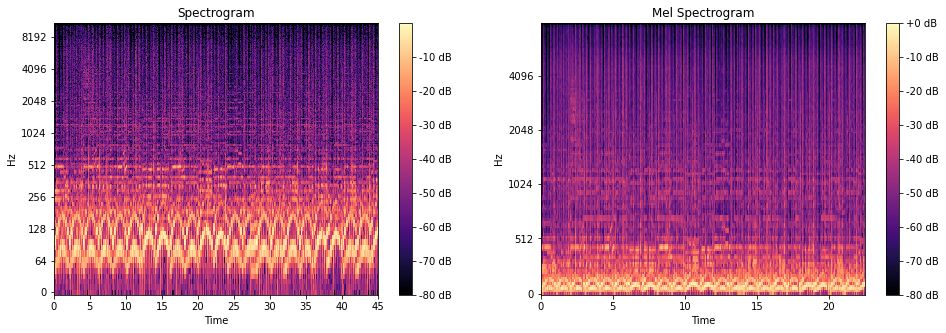

In [15]:
# Computing the spectrogram
spec_1 = np.abs(librosa.stft(test_data, hop_length=512))
spec_1 = librosa.amplitude_to_db(spec_1, ref=np.max) # converting to decibals
# Computing the mel spectrogram
spec_2 = librosa.feature.melspectrogram(y=test_data, sr=sr, n_fft=2048, hop_length=1024)
spec_2 = librosa.power_to_db(spec_2, ref=np.max) # Converting to decibals

# Plotting the spectrogram
plt.figure(figsize=(16,5))
plt.subplot(1,2,1)
librosa.display.specshow(spec_1, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')

# Plotting the mel spectrogram
plt.subplot(1,2,2)
librosa.display.specshow(spec_2, y_axis='mel', fmax=8000, x_axis='time')
plt.title('Mel Spectrogram')
plt.colorbar(format='%+2.0f dB')


## 2.3 Data Normalization
Data normalization is able to transform the values of features in the dataset to a common scale, which increases the generalization degree of the features. In the project, I use Z-score normalization which standardizes the values of a feature by using each value to subtract the mean of the feature data, and then dividing the result by the standard deviation of the feature as below:

$$x_{norm} = \frac{x - \frac{1}{n} \sum_{i=1}^{n} x_i}{\sqrt{\frac{1}{n} \sum_{i=1}^{n} (x_i - \frac{1}{n} \sum_{i=1}^{n} x_i)^2}}$$

We can use function `torch.mean()` to calculate the mean and use function `torch.std()` to calculate the standard deviation.

In [16]:
import torch

t_log_mel_spectrogram = torch.tensor(spec_2) # Convert the numpy array into tensor
N_log_mel_spectrogram = (t_log_mel_spectrogram-torch.mean(t_log_mel_spectrogram))/ torch.std(t_log_mel_spectrogram)
print(f"The Log-Mel Spectrogram before normalization:\n\n {t_log_mel_spectrogram}.\n\n")
print(f"The Log-Mel Spectrogram after normalization:\n\n {N_log_mel_spectrogram}.")

The Log-Mel Spectrogram before normalization:

 tensor([[-80.0000, -46.3780, -24.8329,  ..., -49.1112, -52.2037, -32.2711],
        [-80.0000, -46.9296, -15.0663,  ..., -43.5642, -51.1071, -25.9886],
        [-80.0000, -51.4279,  -7.7446,  ..., -37.9580, -39.6852, -20.8803],
        ...,
        [-80.0000, -80.0000, -64.2846,  ..., -70.8849, -67.7460, -78.8654],
        [-80.0000, -80.0000, -71.0905,  ..., -73.9923, -70.2080, -80.0000],
        [-80.0000, -80.0000, -80.0000,  ..., -80.0000, -80.0000, -80.0000]]).


The Log-Mel Spectrogram after normalization:

 tensor([[-2.3039,  0.1659,  1.7485,  ..., -0.0349, -0.2621,  1.2021],
        [-2.3039,  0.1254,  2.4659,  ...,  0.3726, -0.1815,  1.6636],
        [-2.3039, -0.2051,  3.0038,  ...,  0.7844,  0.6575,  2.0389],
        ...,
        [-2.3039, -2.3039, -1.1495,  ..., -1.6343, -1.4038, -2.2206],
        [-2.3039, -2.3039, -1.6494,  ..., -1.8626, -1.5846, -2.3039],
        [-2.3039, -2.3039, -2.3039,  ..., -2.3039, -2.3039, -2.3039]]

# 3. Data Loading

I created a module called `Load_data`, which contains a subclass of the Dataset `class AudioDataset`, the collate function `custom_collate_fn` and the `load_data` function to split the data.

In [7]:
import importlib
import Dataloader 
importlib.reload(Dataloader)
from Dataloader import*

In [8]:
train_dl, test_dl = load_data(data_path=df_labeled, batch_sz=32)

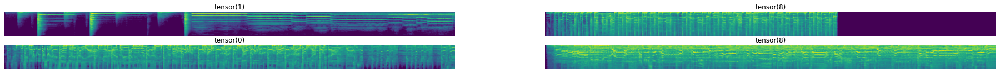

In [60]:
plt.figure(figsize=[32,2])
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.axis("off")
    plt.imshow(next(iter(train_dl))[0][20].permute(1,2,0))
    plt.title(next(iter(train_dl))[1][20])

# 4. Classification
Extensive experiments demonstrate that deep learning methods greatly improve the performance of MER systems over
traditional machine learning methods. Therefore, deep learning methods have become more popular in recent years. In this project, I will use two different models (TinyVGG and ResNet) and compare their training results. Since the model parameters need to be constantly modified, I imported the `importlib` library to reload the modules so that I don't have to rerun the kernel after each modification.

## 4.1 Device
In this project, I set the device to GPU (i.e. Cuda), in order to speed up the training.

In [9]:
DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
DEVICE

device(type='cuda')

## 4.2 ExponentialLR
`ExponentialLR` reduces the learning rate at each step by a factor of `gamma`. The learning rate is first initialised and then at each step the learning rate is multiplied by `gamma`. it is defined in `torch.optim.lr_scheduler` and is usually used in combination with an `optimiser`.

In [10]:
from torch.optim.lr_scheduler import ExponentialLR

## 4.3 Early Stopping
Early stopping is used to prevent overfitting of models. Once a specified limit is reached, the training process is stopped so that the model is not over-trained on the training data. In this project, I defined an `EarlyStopper` module and set the corresponding `patience` and `tolerance`. `patience` refers to the number of unraised times that can be tolerated, and `tolerance` refers to the value of unraised correctness that can be tolerated.

In [11]:
import EarlyStopper
importlib.reload(EarlyStopper)
from EarlyStopper import *

## 4.4 Logging
We can use the `SummaryWriter` class in the `torch.utils.tensorboard` module to record data from training to the TensorBoard, and can start a web server and view the recorded data in a web browser by typing TensorBoard-related commands `tensorboard --logdir=runs/` in the terminal.

In [12]:
from torch.utils.tensorboard import SummaryWriter

2024-05-12 19:57:29.314803: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-05-12 19:57:29.340850: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-12 19:57:33.820909: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## 4.5 Checkpointing
Checkpoints allows the parameters of the model to be periodically saved to a file and then loaded into the model when training is resumed. This is useful in cases where training is interrupted or where we want to save the state of the model at a certain point in training for later use.

In [13]:
import Checkpointing
importlib.reload(Checkpointing)
from Checkpointing import *

## 4.6 Training
I use the train function and the val function in the module `TrainAndVal` to train.

In [19]:
import TrainAndVal
importlib.reload(TrainAndVal)

<module 'TrainAndVal' from '/home/s5614279/Media Data Analytics and Modelling/MER/TrainAndVal.py'>

## 4.7 VGG
The architecture of TinyVGG typically consists of several convolutional layers , activation layers and pooling layers, followed by a few fully connected layers, and finally an output layer for classifying the input tensor into one of several predefined classes. Each of the layer performs a specific function in the process of transforming the input into a set of output features:<br>• Input layer: Receiving the input image or tensor.<br>• Convolutional layer: Performing the convolution operation on the input data.<br>• Activation layer: Applying a non-linear function to the output of the convolutional layer.<br> • Pooling layer: Reducing the dimensionality of the feature maps produced by the convolutional layer.<br> • Fully connected layer: Receiving the output of the previous layers and computing a set of weighted sum outputs.<br>• Output layer: producing the final output of the network.<br>
<img src="doc/VGGnetwork.png" width="1500" height="300">

In this project, I set up three blocks in the `TinyVGG` model, performed six convolutions and three poolings. The architecture of this model can be viewed in file `TinyVGG.py`.

In [17]:
import TinyVGG
importlib.reload(TinyVGG)

<module 'TinyVGG' from '/home/s5614279/Media Data Analytics and Modelling/MER/TinyVGG.py'>

In [20]:
from torchmetrics import Accuracy
from tqdm.auto import tqdm
import torch.nn as nn

# Seed for setting the CUDA random number generator to ensure reproducible results when computing with CUDA
torch.cuda.manual_seed(30)

epochs = 100
checkpoint_frequency=3
learning_rate = 0.01

network = TinyVGG.TinyVGG_Model(input_shape=1,hidden_units=10,output_shape=9).to(DEVICE)
acc_fn = Accuracy(task="multiclass", num_classes=9).to(DEVICE)
loss_fn =  nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(params=network.parameters(),lr=learning_rate)
schd = ExponentialLR(optimizer,gamma=1)
stopper =  EarlyStopper(patience=10, tolerance=0.1)
writer = SummaryWriter()

network = network.to(DEVICE)

train_accs = []
val_accs = []
train_losses = []
val_losses = []

for epoch in tqdm(range(epochs)):
  
    print(f"Epoch: {epoch}\n-------")
    
    train_acc, train_loss = TrainAndVal.train_step(epoch=epoch,
               model=network,
               data_loader=train_dl, 
               loss_fn=loss_fn, 
               optimizer=optimizer,
               lr_scheduler=schd,
               acc_fn = acc_fn,
               writer = writer,
               DEVICE = DEVICE
              )
    train_accs.append(train_acc)
    train_losses.append(train_loss)

    if epoch % checkpoint_frequency == 0:
        Checkpointing.TinyVGG_save_checkpoint(model=network, epoch=epoch, save_dir="saved_models")

    val_acc, val_loss, early_stop = TrainAndVal.val_step(epoch, network, test_dl, loss_fn, stopper, acc_fn, writer, DEVICE)
    val_accs.append(val_acc)
    val_losses.append(val_loss)

    if early_stop:
        break

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 0
-------


Train loss: 1.76510 | Train acc: 0.45% | LR: 0.01000
Validation loss: 1.54436 | Validation acc: 0.52

Epoch: 1
-------
Train loss: 1.43565 | Train acc: 0.51% | LR: 0.01000
Validation loss: 1.53579 | Validation acc: 0.52

Epoch: 2
-------
Train loss: 1.41095 | Train acc: 0.51% | LR: 0.01000
Validation loss: 1.50619 | Validation acc: 0.52

Epoch: 3
-------
Train loss: 1.39563 | Train acc: 0.51% | LR: 0.01000
Validation loss: 1.50705 | Validation acc: 0.52

Epoch: 4
-------
Train loss: 1.39575 | Train acc: 0.51% | LR: 0.01000
Validation loss: 1.49847 | Validation acc: 0.52

Epoch: 5
-------
Train loss: 1.40944 | Train acc: 0.51% | LR: 0.01000
Validation loss: 1.48526 | Validation acc: 0.52

Epoch: 6
-------
Train loss: 1.39742 | Train acc: 0.51% | LR: 0.01000
Validation loss: 1.48513 | Validation acc: 0.52

Epoch: 7
-------
Train loss: 1.38116 | Train acc: 0.51% | LR: 0.01000
Validation loss: 1.48933 | Validation acc: 0.52

Epoch: 8
-------
Train loss: 1.39121 | Train acc: 0.51% | LR: 0.0

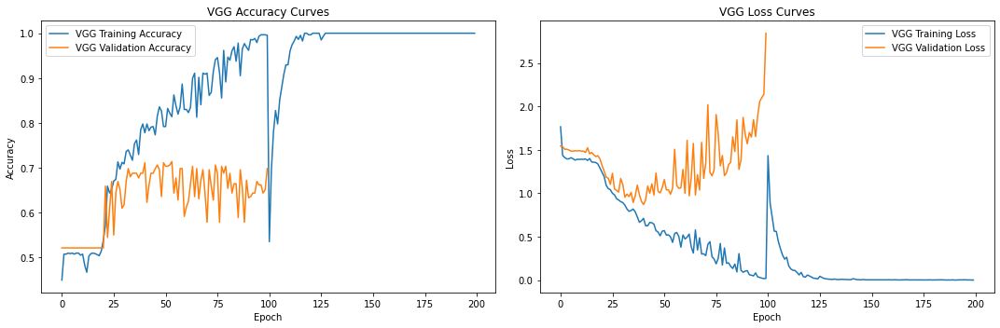

In [41]:
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.plot(train_accs, label='VGG Training Accuracy')
ax1.plot(val_accs, label='VGG Validation Accuracy')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.set_title('VGG Accuracy Curves')
ax1.legend()

ax2.plot(train_losses, label='VGG Training Loss')
ax2.plot(val_losses, label='VGG Validation Loss')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.set_title('VGG Loss Curves')
ax2.legend()

plt.tight_layout()
plt.show()

## 4.8 ResNet Model
As we can see from the training process above, the CNN model is very prone to gradient disappearance, which is a common problem with CNN models. To address this problem, the researchers proposed the `ResNet (Residual Network)` model, whose innovation is the use of residual connectivity, which allows the network to bypass one or more layers and propagate the input directly to deeper layers. This allows the network to go much deeper than a traditional CNN without suffering from the gradient disappearance problem. The architecture of ResNet model can be viewed in file `ResNet.py.`
<img src="doc/ResNet.png" width="1500" height="200">

In [23]:
import ResNet
importlib.reload(ResNet)

<module 'ResNet' from '/home/s5614279/Media Data Analytics and Modelling/MER/ResNet.py'>

In [29]:
from torchmetrics import Accuracy
from tqdm.auto import tqdm
import torch.nn as nn

# Seed for setting the CUDA random number generator to ensure reproducible results when computing with CUDA
torch.cuda.manual_seed(30)

epochs = 100
checkpoint_frequency=3
learning_rate = 0.01

network = ResNet.get_resnet().to(DEVICE)
acc_fn = Accuracy(task="multiclass", num_classes=9).to(DEVICE)
loss_fn =  nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(params=network.parameters(),lr=learning_rate)
schd = ExponentialLR(optimizer,gamma=1)
stopper =  EarlyStopper(patience=5, tolerance=0.1)
writer = SummaryWriter()

network = network.to(DEVICE)
Res_train_accs = []
Res_train_losses = []
Res_val_accs = []
Res_val_losses = []

for epoch in tqdm(range(epochs)):
  
    print(f"Epoch: {epoch}\n-------")
    
    Res_train_acc, Res_train_loss = TrainAndVal.train_step(epoch=epoch,
               model=network,
               data_loader=train_dl, 
               loss_fn=loss_fn, 
               optimizer=optimizer,
               lr_scheduler=schd,
               acc_fn = acc_fn,
               writer = writer,
               DEVICE = DEVICE
              )
    Res_train_accs.append(Res_train_acc)
    Res_train_losses.append(Res_train_loss)

    if epoch % checkpoint_frequency == 0:
        Checkpointing.TinyVGG_save_checkpoint(model=network, epoch=epoch, save_dir="saved_models")

    Res_val_acc, Rest_val_loss, early_stop = TrainAndVal.val_step(epoch, network, test_dl, loss_fn, stopper, acc_fn, writer, DEVICE)
    Res_val_accs.append(Res_val_acc)
    Res_val_losses.append(Rest_val_loss)

    if early_stop:
        break

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 0
-------
Train loss: 1.35152 | Train acc: 0.51% | LR: 0.01000
Validation loss: 1.80004 | Validation acc: 0.52

Epoch: 1
-------
Train loss: 0.91671 | Train acc: 0.67% | LR: 0.01000
Validation loss: 1.44432 | Validation acc: 0.52

Epoch: 2
-------
Train loss: 0.70902 | Train acc: 0.75% | LR: 0.01000
Validation loss: 1.18029 | Validation acc: 0.57

Epoch: 3
-------
Train loss: 0.66790 | Train acc: 0.78% | LR: 0.01000
Validation loss: 0.97208 | Validation acc: 0.65

Epoch: 4
-------
Train loss: 0.55903 | Train acc: 0.79% | LR: 0.01000
Validation loss: 0.94512 | Validation acc: 0.65

Epoch: 5
-------
Train loss: 0.52622 | Train acc: 0.82% | LR: 0.01000
Validation loss: 0.88900 | Validation acc: 0.71

Epoch: 6
-------
Train loss: 0.39375 | Train acc: 0.87% | LR: 0.01000
Validation loss: 0.89607 | Validation acc: 0.73

Epoch: 7
-------
Train loss: 0.34560 | Train acc: 0.89% | LR: 0.01000
Validation loss: 0.95416 | Validation acc: 0.68

Epoch: 8
-------
Train loss: 0.27885 | Train acc

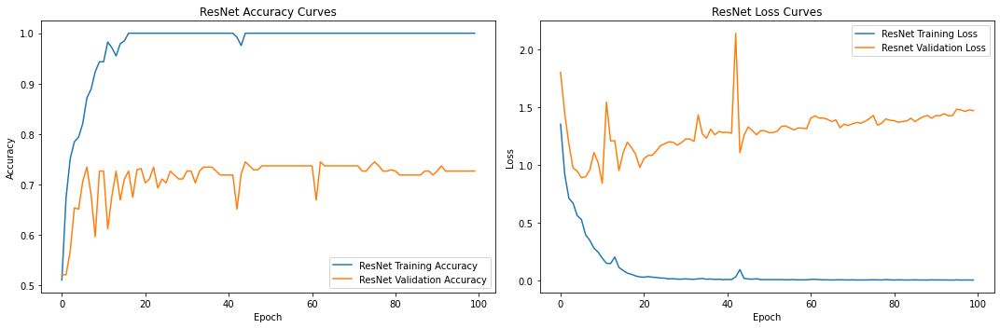

In [42]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# 在左侧的子图中绘制 accuracy 曲线
ax1.plot(Res_train_accs, label='ResNet Training Accuracy')
ax1.plot(Res_val_accs, label='ResNet Validation Accuracy')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.set_title('ResNet Accuracy Curves')
ax1.legend()

# 在右侧的子图中绘制 loss 曲线
ax2.plot(Res_train_losses, label='ResNet Training Loss')
ax2.plot(Res_val_losses, label='Resnet Validation Loss')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.set_title('ResNet Loss Curves')
ax2.legend()

# 调整子图之间的间距
plt.tight_layout()

# 显示图形
plt.show()

## 4.9 Deployment
Now we are satisfied with this trained model, we can load it from the latest checkpoint that has been saved. The exact number will depend on when the training was stopped so please check this in `saved_models` directory before loading.

In [32]:
import torch

# 5. Evaluation

In [34]:
ResNet_best_epoch = 63
ResNet_loaded_net = torch.load(f"saved_models/ResNet_checkpoint_{ResNet_best_epoch}.pt")
VGG_best_epoch = 51 
VGG_loaded_net = torch.load(f"saved_models/TinyVGG_checkpoint_{VGG_best_epoch}.pt")

## Confusion Matrix
we can assess the performance and visualize a confusion matrix for better understanding.  I use the ConfusionMatrix module to draw the matrix.

In [38]:
import ConfusionMatrix
importlib.reload(ConfusionMatrix)

<module 'ConfusionMatrix' from '/home/s5614279/Media Data Analytics and Modelling/MER/ConfusionMatrix.py'>

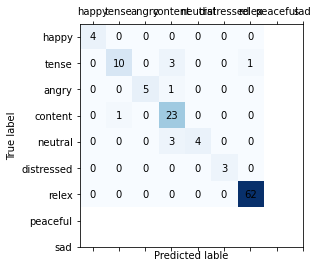

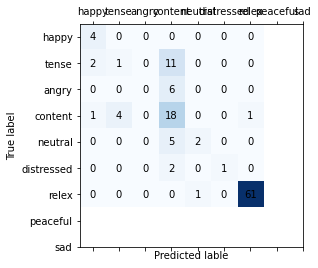

In [39]:
ConfusionMatrix.ConfusionMatrix(model=ResNet_loaded_net, dataloader=test_dl, DEVICE=DEVICE)
ConfusionMatrix.ConfusionMatrix(model=VGG_loaded_net, dataloader=test_dl, DEVICE=DEVICE)

# 6. Single Data Test
In the test step I designed two test functions and put them in the `RealTimeTest` module. One is `AudioTest` function that makes predictions by calling the path of a certain audio data, and the other is `RealTimeAudioTest` function that allows real-time voice input and makes predictions.

In [ ]:
import RealTimeTest
importlib.reload(RealTimeTest)

In [ ]:
TestModel = ResNet_loaded_net.to("cpu")
TestPath = df_labeled["Audio Path"][11]

## 6.1 Audio File Test
As we previously used part of the two dataset for training and validation, we use data from the rest of the datasets for testing in this module, which also facilitates the testing of the generalisation ability of the model. After trying different data, it is found that the model performed well in tests across datasets and could predict the emotional state of most of the speech data correctly.

In [ ]:
ipd.Audio(TestPath)